In [35]:
import os, glob
import tqdm
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [36]:
# Data path
data_path = 'css-data'
# Train, Valid and Test path
train_path = os.path.join(data_path, 'train')
valid_path = os.path.join(data_path, 'valid')
test_path = os.path.join(data_path, 'test')
# For saving results
output_path = 'working'
# We can access both images and labels
folders = ['images', 'labels']
print("Data Path: {}\nTrain Path: {}\nValid Path: {}\nTest Path: {}\nOutput Path: {}".format(data_path, train_path, valid_path, test_path, output_path))

Data Path: css-data
Train Path: css-data\train
Valid Path: css-data\valid
Test Path: css-data\test
Output Path: working


In [37]:
# Initialize dictionaries of training and classes
train_dict = dict(train=0, valid=1, test=2)
path_dict = [train_path, valid_path, test_path]
class_names = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']
class_dict = dict(zip(range(len(class_names)), class_names))
print(class_dict)

{0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


In [38]:
## Get filenames and labels information
# Sorting the filenames will make the labels and images in same order 
train_filenames = sorted(os.listdir(os.path.join(train_path, folders[0])))
valid_filenames = sorted(os.listdir(os.path.join(valid_path, folders[0])))
test_filenames = sorted(os.listdir(os.path.join(test_path, folders[0])))
train_labels = sorted(os.listdir(os.path.join(train_path, folders[1])))
valid_labels = sorted(os.listdir(os.path.join(valid_path, folders[1])))
test_labels = sorted(os.listdir(os.path.join(test_path, folders[1])))

In [39]:
#Cantidad de datos
print("Total Train Files: {}\nTotal Valid Files: {}\nTotal Test Files:{}".format(len(train_filenames), len(valid_filenames), len(test_filenames)))

Total Train Files: 3518
Total Valid Files: 114
Total Test Files:82


In [40]:
len(train_filenames)==len(train_labels), len(valid_filenames)==len(valid_labels), len(test_filenames)==len(test_labels)

(True, True, True)

In [41]:
# Revisar orden 
[item.split('.')[0] for item in train_filenames]==[item.split('.')[0] for item in train_labels],\
[item.split('.')[0] for item in valid_filenames]==[item.split('.')[0] for item in valid_labels],\
[item.split('.')[0] for item in test_filenames]==[item.split('.')[0] for item in test_labels]

(True, True, True)

In [42]:
set(train_filenames).intersection(set(valid_filenames)),\
set(valid_filenames).intersection(set(test_filenames)),\
set(test_filenames).intersection(set(train_filenames))

(set(), set(), set())

In [43]:
df = pd.DataFrame()
df['filenames'] = train_filenames + valid_filenames + test_filenames
df['labelnames'] = train_labels + valid_labels + test_labels
df['train_id'] = [0]*len(train_filenames) + [1]*len(valid_filenames) + [2]*len(test_filenames)

In [44]:
df.head()

,filenames,labelnames,train_id
0,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,0
1,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,0
2,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,0
3,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,0
4,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,0


In [45]:
df.filenames.duplicated().value_counts()

filenames
False    3714
Name: count, dtype: int64

In [46]:
df.train_id.value_counts()

train_id
0    3518
1     114
2      82
Name: count, dtype: int64

<Axes: title={'center': 'Train-Val-Test Split'}, xlabel='train_id'>

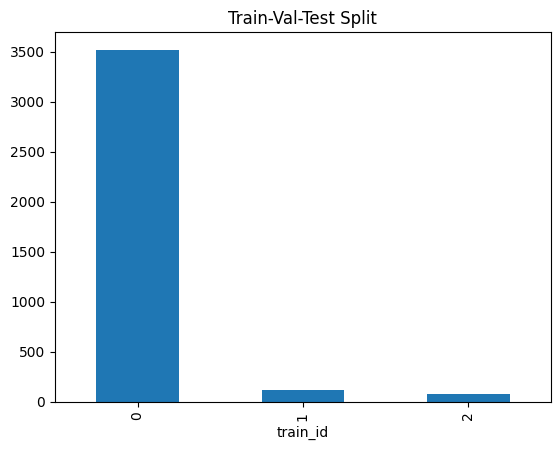

In [47]:
df.train_id.value_counts().plot(kind = 'bar', title = 'Train-Val-Test Split')

In [48]:
train_keys = list(train_dict.keys())

In [49]:
# Complete path for annotation_files
annotation_files = (data_path + '/' + df.train_id.map(lambda x: train_keys[x]) + '/' + folders[1]
                    + '/' + df.labelnames).tolist()
t_id = df.train_id.tolist()
counts = []
invalid_idx = []
is_annotated = []
for idx, annotation_file in tqdm.tqdm(enumerate(annotation_files)):
    annotation = np.loadtxt(annotation_file)
    if len(annotation)==0:
        invalid_idx.append(idx)
        is_annotated.append(-1)
        counts.append([])
        continue
    if len(annotation.shape)==1:
        annotation = annotation.reshape(1, -1)
    counts.append(annotation[:,0].astype(int))
    is_annotated.append(1)
df['is_annotated'] = is_annotated

3714it [00:01, 3543.89it/s]


In [50]:
df.is_annotated.value_counts()

is_annotated
 1    3687
-1      27
Name: count, dtype: int64

In [51]:
# Create a count_dict which holds class counts per split (train/valid/test)
count_list = [np.unique(item, return_counts = True) for item in counts]
count_keys = [item[0] for item in count_list]
count_values = [item[1] for item in count_list]
count_dict = []
for ck,cv in zip(count_keys, count_values):
    count_dict.append(dict([(key,value) for key, value in zip(ck,cv)]))
df['count_dict'] = count_dict

In [52]:
from collections import Counter
train_count = df[df.train_id==0].count_dict.apply(lambda x: Counter(x)).sum()
valid_count = df[df.train_id==1].count_dict.apply(lambda x: Counter(x)).sum()
test_count = df[df.train_id==2].count_dict.apply(lambda x: Counter(x)).sum()

In [53]:
train_count = {key:value/sum(train_count.values()) for key, value in train_count.items()}
valid_count = {key:value/sum(valid_count.values()) for key, value in valid_count.items()}
test_count = {key:value/sum(test_count.values()) for key, value in test_count.items()}

In [54]:
print("Train Class Distribution Dict: {}\n\nValid Class Distribution Dict: {}\n\nTest Class Distribution Dict: {}"
     .format(train_count, valid_count, test_count))

Train Class Distribution Dict: {np.int64(0): np.float64(0.0849025069637883), np.int64(1): np.float64(0.05907520891364902), np.int64(2): np.float64(0.0836991643454039), np.int64(3): np.float64(0.08940389972144847), np.int64(5): np.float64(0.26034540389972144), np.int64(4): np.float64(0.11988857938718663), np.int64(7): np.float64(0.07538718662952647), np.int64(8): np.float64(0.11723676880222841), np.int64(6): np.float64(0.07556545961002785), np.int64(9): np.float64(0.034495821727019496)}

Valid Class Distribution Dict: {np.int64(0): np.float64(0.1133428981348637), np.int64(3): np.float64(0.10616929698708752), np.int64(4): np.float64(0.15208034433285508), np.int64(5): np.float64(0.2381635581061693), np.int64(7): np.float64(0.058823529411764705), np.int64(2): np.float64(0.09899569583931134), np.int64(1): np.float64(0.03012912482065997), np.int64(6): np.float64(0.06312769010043041), np.int64(8): np.float64(0.07890961262553801), np.int64(9): np.float64(0.06025824964131994)}

Test Class Distr

In [55]:
df_count = pd.DataFrame()
df_count = pd.DataFrame({'train':train_count, 'valid': valid_count, 'test': test_count}).sort_index()

In [56]:
df_count['idx'] = pd.Series(df_count.index)

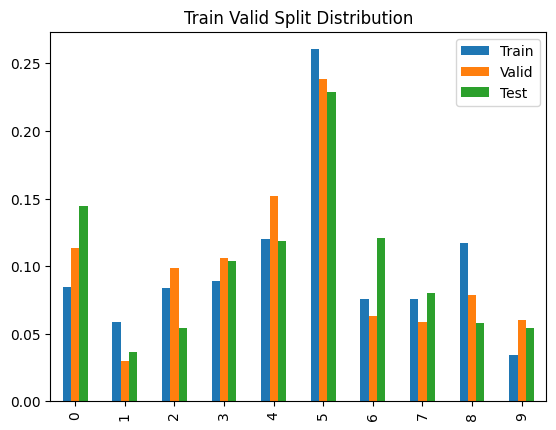

In [57]:
df_count.plot(y = ['train', 'valid', 'test'], kind = 'bar', title = 'Train Valid Split Distribution')
plt.legend(['Train', 'Valid', 'Test'])

In [58]:
train_count_pct = {k: v / sum(train_count.values()) * 100 for k, v in train_count.items()}
valid_count_pct = {k: v / sum(valid_count.values()) * 100 for k, v in valid_count.items()}
test_count_pct  = {k: v / sum(test_count.values()) * 100 for k, v in test_count.items()}

df_pct = pd.DataFrame({
    'train': train_count_pct,
    'valid': valid_count_pct,
    'test': test_count_pct
}).sort_index().fillna(0)

print(df_pct.round(2))

   train  valid   test
0   8.49  11.33  14.47
1   5.91   3.01   3.68
2   8.37   9.90   5.39
3   8.94  10.62  10.39
4  11.99  15.21  11.84
5  26.03  23.82  22.89
6   7.56   6.31  12.11
7   7.54   5.88   8.03
8  11.72   7.89   5.79
9   3.45   6.03   5.39


In [59]:
def yolo_annotation_to_bbox(annotation, img_height, img_width):
    """
    Converts Yolo annotations to bounding box coordinates
    Input:
    annotation: str, annotation file in .txt format
    img_height: int, image height
    img_width: int, image width
    Output:
    class: list, List of labels in the image
    bbox_list: list, List of bounding boxes in an image
    """
    sh = annotation.shape
    if len(sh)==0:
        print("No bounding box found")
    if len(sh)==1:
        annotation = annotation.reshape(1, -1)
    num_bbox = len(annotation)
    bbox_list = []
    for idx in range(num_bbox):
        c_x, c_y, w, h = annotation[idx][1:]
        x1 = ((c_x - w/2)*img_width).astype(int)
        x2 = ((c_x + w/2)*img_width).astype(int)
        y1 = ((c_y - h/2)*img_height).astype(int)
        y2 = ((c_y + h/2)*img_height).astype(int)
        bbox_list.append([x1, y1, x2, y2])
    return bbox_list

In [60]:
### invalid_files = (data_path + '/' + df.train_id[invalid_idx].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[invalid_idx])
invalid_files = df.filenames[invalid_idx]
def visualize_samples(mode = 'train', n_samples = 12):
    """
    Plots 'n_samples' plots from train/valid/test split
    Input:
    mode: 'str' can take values from 'train'/'valid','test'
    n_samples: 'int'
    """
    # We will visualize only those files which have annotations 
    indices = df[(~df.filenames.isin(invalid_files))&(df.train_id==1)].sample(n_samples).index
    filenames = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[indices]).tolist()
    annotations = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[1] + '/' + df.labelnames[indices]).tolist()
    plt.figure(figsize = (21, 11))
    plt.title('{} Set Samples'.format(mode.upper()))
    for idx in range(len(filenames)):
        image = np.array(Image.open(filenames[idx]))
        height, width, _ = image.shape 
        annotation = np.loadtxt(annotations[idx])
        bbox_list = yolo_annotation_to_bbox(annotation, height, width)
        if len(annotation.shape)==1:
            annotation = annotation.reshape(1, -1)
        labels = [class_dict[item] for item in annotation[:,0].astype(int)]
        plt.subplot(3, 4, idx + 1)
        for label, bbox in zip(labels, bbox_list):
            x1, y1, x2, y2 = bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        plt.imshow(image)
    plt.tight_layout()
    plt.show()

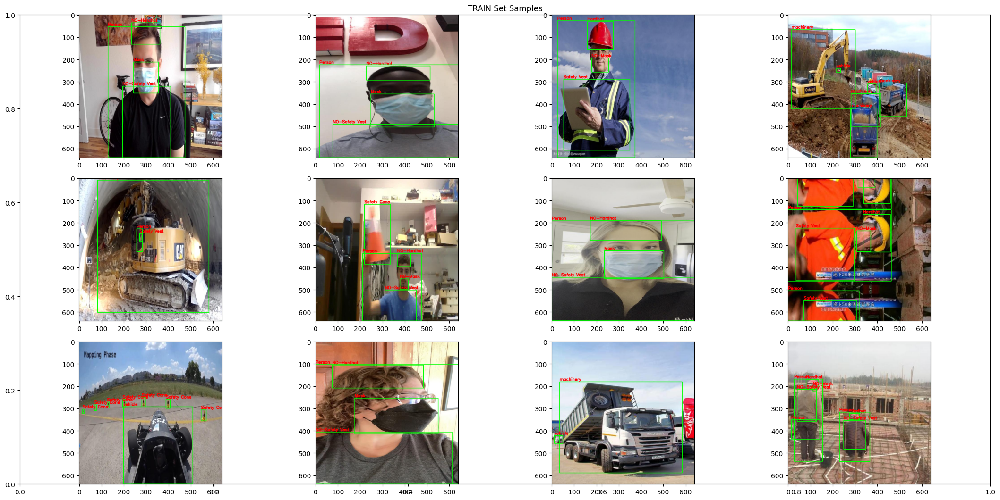

In [61]:
visualize_samples(mode = 'train', n_samples = 12)

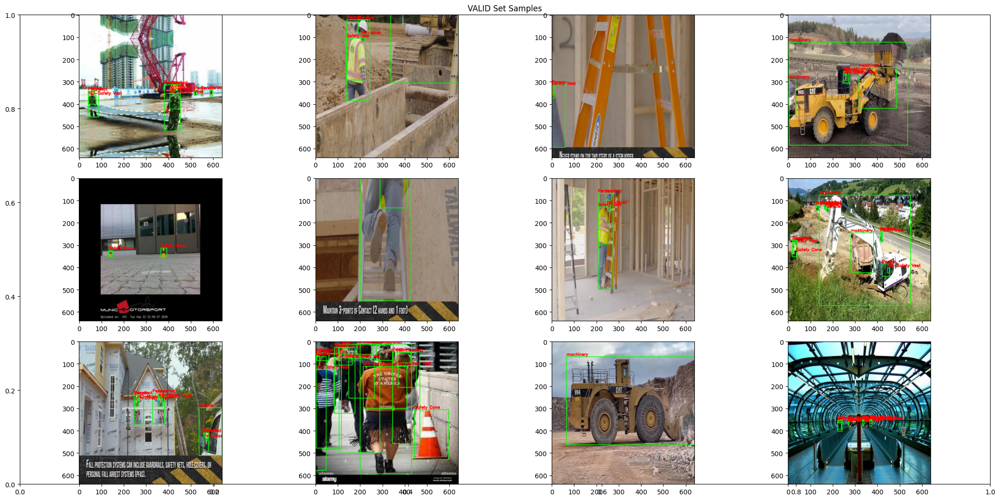

In [62]:
visualize_samples(mode = 'valid', n_samples = 12)

In [63]:
import yaml
ppe_data = dict(train = train_path,
                    val = valid_path,
                    test = test_path,
                   nc = len(class_names),
                   names = class_names)
with open('ppe_data.yaml', 'w') as output:
    yaml.dump(ppe_data, output, default_flow_style = True)

In [64]:
import torch
print(torch.cuda.is_available())

True


In [65]:
print(torch.cuda.get_device_name(0))

NVIDIA GeForce RTX 3050


In [ ]:
""" configuracion inicial seba sin filtros ni data argumentation aplicadas el resto de eentrenamientos hasta train-6 a 7!yolo task=detect mode=train epochs=180 data='ppe_data.yaml' model=yolo11n.pt imgsz=640 patience=10"""
"""Primera modificacion train-8 !yolo task=detect mode=train epochs=180 data='ppe_data.yaml' model=yolo11n.pt imgsz=640 patience=10 cache=False workers=2 degrees=15 fliplr=0.5 mosaic=1.0 mixup=0.1 copy_paste=0.3 """
"""Segunda modificacion train-9 !yolo task=detect mode=train epochs=200 data='ppe_data.yaml' model=yolo11n.pt imgsz=640 patience=15 cache=False workers=4 degrees=10 fliplr=0.5 mosaic=0.5 mixup=0.0 copy_paste=0.1 """
"""  !yolo task=detect mode=train epochs=200 data='ppe_data.yaml' model=yolo11n.pt imgsz=640 patience=15 cache=False workers=4  """
"""  !yolo task=detect mode=train epochs=300 data='ppe_data.yaml' model=yolo11n.pt imgsz=640 patience=25 cache=False workers=4 """
"""train 12 use el modelo anterior train11 last.pt como base y añadi imagenes adicionales (resultado en camara terrible) !yolo task=detect mode=train model='runs/detect/train-11/weights/last.pt' data='ppe_data.yaml' epochs=500 patience=40 imgsz=640 cache=False workers=4 """
""" train 13 use modelo predeterminado de yolo y funciono mejor al momento de implementar la camara !yolo task=detect mode=train model=yolo11n.pt data='ppe_data.yaml' epochs=300 patience=30 imgsz=640 cache=False workers=4 """

""" train 15 con total 3500 aprox imagenes se añadieron casi 1000 llego a 300 epocas como mucho !yolo task=detect mode=train model=yolo11n.pt data='ppe_data.yaml' epochs=400 patience=50 imgsz=640 cache=False workers=4 """
""" ahora cambiamos al modelo yolo11s.pt"""
!yolo task=detect mode=train model=yolo11s.pt data='ppe_data.yaml' epochs=250 patience=25 imgsz=640 workers=6


New https://pypi.org/project/ultralytics/8.4.60 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.57  Python-3.12.10 torch-2.12.0+cu130 CUDA:0 (NVIDIA GeForce RTX 3050, 8191MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=ppe_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=250, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=tra

In [67]:

train_results_path = os.path.join('runs', 'detect', 'train')
csv_results = os.path.join(train_results_path, 'results.csv')
df_results = pd.read_csv(csv_results)
df_results.head(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,619.029,1.40289,2.79618,1.49597,0.43940,0.37440,0.34129,0.16741,1.77242,2.42679,1.73362,0.000237,0.000237,0.000237
1,2,1191.840,1.31854,1.87040,1.44558,0.52258,0.41878,0.39262,0.16772,1.87591,2.19356,1.82617,0.000470,0.000470,0.000470
2,3,1764.590,1.27512,1.69003,1.41529,0.62780,0.40188,0.44401,0.19503,1.91605,2.24085,1.92676,0.000698,0.000698,0.000698
3,4,2344.460,1.25176,1.59814,1.39241,0.56142,0.53621,0.52441,0.24159,1.81833,1.98270,1.77994,0.000693,0.000693,0.000693


In [68]:
from ultralytics import YOLO
import os, glob

best_model = os.path.join(train_results_path, 'best.pt')
if not os.path.exists(best_model):
    alt = os.path.join(train_results_path, 'last.pt')
    if os.path.exists(alt):
        best_model = alt
    else:
        raise FileNotFoundError(f"No trained weights found in {train_results_path}. Expected 'best.pt' or 'last.pt'.")

test_results_path = os.path.join('runs', 'detect', 'predict', 'weight')
os.makedirs(test_results_path, exist_ok=True)

test_result_filenames = glob.glob(os.path.join(test_results_path, '*.*'))

model = YOLO(best_model)

# If there are no files in predict/weight, run inference on the test dataset folder
if not test_result_filenames:
    results = model.predict(source=test_path, save=True, show=True, save_txt=True)
else:
    results = model.predict(source=test_results_path, save=True, show=True, save_txt=True)
    for filename in test_result_filenames:
        model.predict(source=filename, save=True, show=True, save_txt=True)
        raise FileNotFoundError(f"No trained weights found in {train_results_path}. Expected 'best.pt' or 'last.pt'.")

test_results_path = os.path.join('runs', 'detect', 'predict', 'weight')
os.makedirs(test_results_path, exist_ok=True)

test_result_filenames = glob.glob(os.path.join(test_results_path, '*.*'))

model = YOLO(best_model)

# If there are no files in predict/weight, run inference on the test dataset folder
if not test_result_filenames:
    results = model.predict(source=test_path, save=True, show=True, save_txt=True)
else:
    results = model.predict(source=test_results_path, save=True, show=True, save_txt=True)
    for filename in test_result_filenames:
        model.predict(source=filename, save=True, show=True, save_txt=True)

FileNotFoundError: No trained weights found in runs\detect\train. Expected 'best.pt' or 'last.pt'.